In [ ]:
NAME = "Animesh Bhattacharjee"
ID = "22101243"
COLLABORATORS_ID = ["", ""]

# Necessary library import

In [ ]:
import numpy as np
from skimage import io, color, exposure
import matplotlib.pyplot as plt

# Task 1 - Basic Image Operation

import your image or any photo taken by you (`sample.jpeg`) as a numpy array, save it in the varaible `I`.

A picture taken from your phone of any scenary/streets/building is better.

remember your image name MUST be `sample.jpeg`.

Make sure the height and the width of the image is **smaller than 1000 pixels**.

In [ ]:
I = io.imread("sample.jpg") # Replace None with appropriate function call line


# find the height and the width of the image
H = I.shape[0] # should contain height
W = I.shape[1] # should contain width
print("Height is", H)
print("Width is", W)

### BEGIN SOLUTION

### END SOLUTION

Height is 753
Width is 1000


<function matplotlib.pyplot.show(close=None, block=None)>

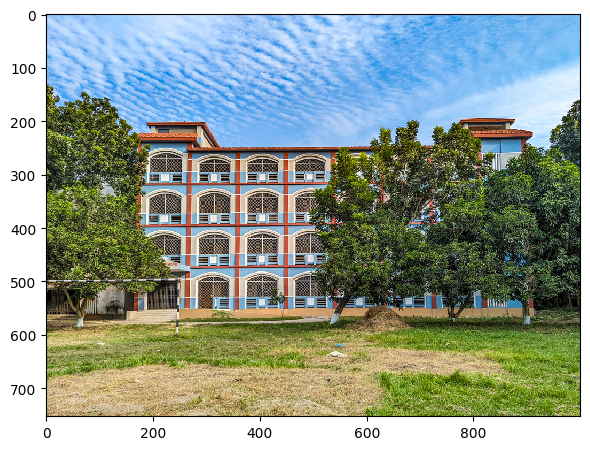

In [ ]:
# Normalize the image so that the gray scales are between 0 and 1. Save it to I and display the image
I = I/255

### BEGIN SOLUTION
io.imshow(I)
plt.show
### END SOLUTION

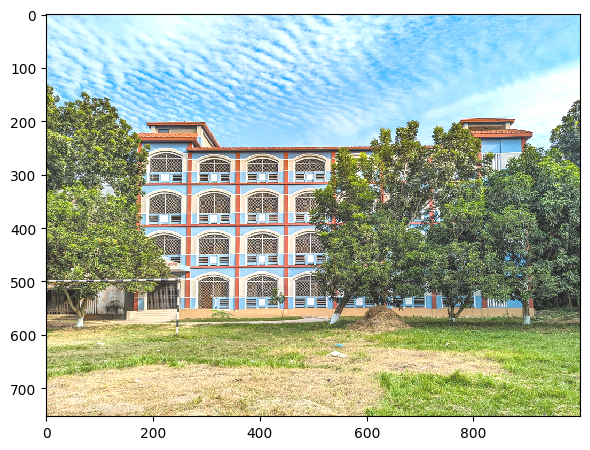

In [ ]:
# Increase the brightness of the image without changing the contrast.
# Save the resulting image in I_bright and display it.
I_bright = np.clip(I + 0.15, 0, 1)

### BEGIN SOLUTION
io.imshow(I_bright)
plt.show()
### END SOLUTION

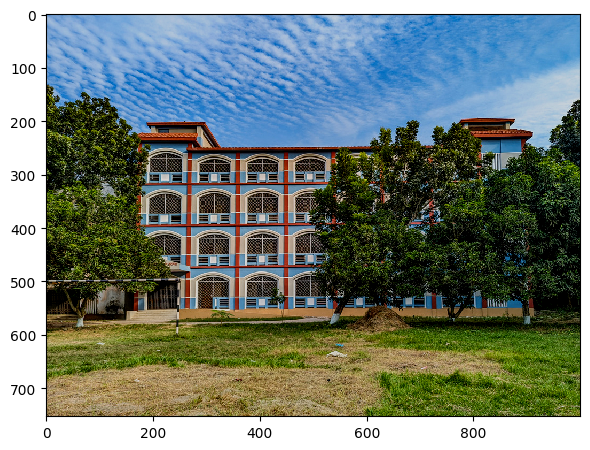

In [ ]:
# Decrease the brightness of the image without changing the contrast.
# Save the resulting image in I_dark and display it.
I_dark = np.clip(I - 0.15, 0, 1)

### BEGIN SOLUTION
io.imshow(I_dark)
plt.show()
### END SOLUTION

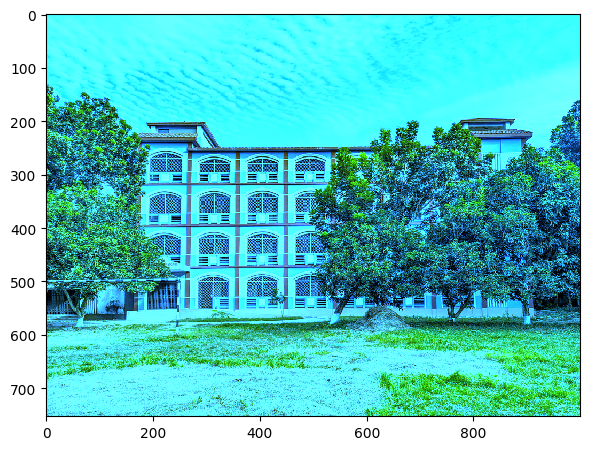

In [ ]:
# Multiply the three channels of image I with three DIFFERENT numbers between 0.3 and 3
# Save the resulting image in I_tint and display it.
# The resulting image should have some color shift
I_tint = np.zeros(I.shape)

# HINT:
# I_tint = np.zeros(I.shape)
# I_tint[:, :, 0] =  ..... I[:, :, 0].....
# ......

### BEGIN SOLUTION
I_tint[:, :, 0] = np.clip(0.5 * I[:, :, 0], 0, 1)
I_tint[:, :, 1] = np.clip(1.5 * I[:, :, 1], 0, 1)
I_tint[:, :, 2] = np.clip(2.9 * I[:, :, 2], 0, 1)

io.imshow(I_tint)
plt.show()

### END SOLUTION

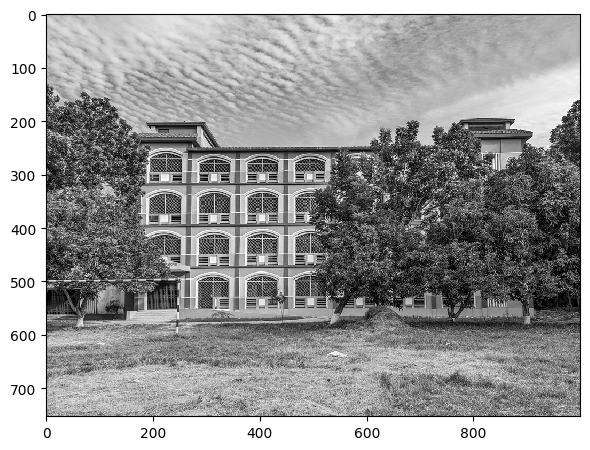

In [ ]:
# Convert the image into a grayscale image.
# Save it to I_gray and display it
I_gray = color.rgb2gray(I)

### BEGIN SOLUTION
io.imshow(I_gray)
plt.show()
### END SOLUTION

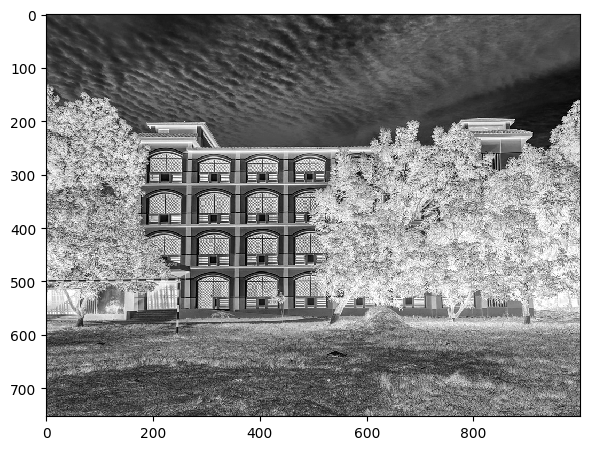

In [ ]:
# Display the negative of the grayscale image
I_negative = 1 - I_gray
### BEGIN SOLUTION
io.imshow(I_negative)
plt.show()
### END SOLUTION

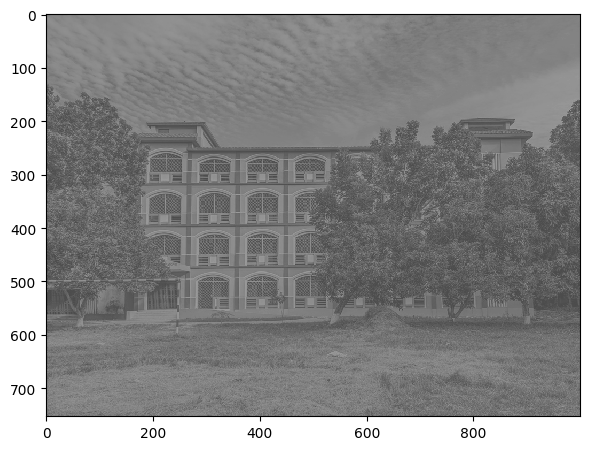

In [ ]:
# Artificially degrade the **grayscale image** by reducing it contrast
# You can do so by recaling the gray values and concentrating them in a narrow range,
# say between 0.3 and 0.6.
# Save the image as I_degraded and display it
# HINT: SEE lec-4-demo-codes

I_degraded = exposure.rescale_intensity(I_gray, in_range=(0, 1), out_range=(0.3, 0.6))

### BEGIN SOLUTION
io.imshow(I_degraded)
plt.show()
### END SOLUTION

In [ ]:
# Complete the following function to perform Piecewise Linear Contrast stretching
# That is, implement the map shown in Slide 17 of Lecture 3

# Prototype: piecewise_contrast_stretch(I_gray, r1, r2, s1, s2)
# Assuming both input and output images are normalized between 0 and 1

def piecewise_contrast_stretch(I, r1, r2, s1, s2):
    # Write your code here
    I_stretched = np.zeros(I.shape) # replace with appropriate code
    I_stretched[I <= r1] = I[I <= r1] * s1 / r1
    I_stretched[(I > r1) & (I <= r2)] = (I[(I > r1) & (I <= r2)]- r1) * (s2 - s1) / (r2 - r1) + s1
    I_stretched[I > r2] = (I[I > r2] - r2) * (1 - s2) / (1 - r2)+ s2

    return I_stretched
    ### BEGIN SOLUTION

    ### END SOLUTION



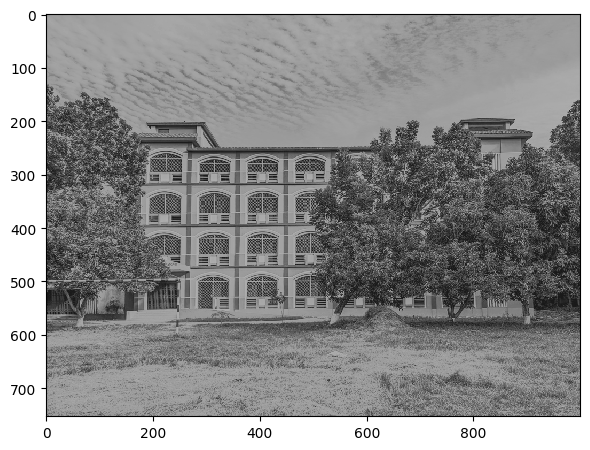

In [ ]:
# To test your implementation, contrast strech the degraded image I_degrade
r1 = 0.3
r2 = 0.5
s1 = 0.1
s2 = 0.6
I_stretched = piecewise_contrast_stretch(I_degraded, r1, r2, s1, s2)

# Display the strtched image

### BEGIN SOLUTION
io.imshow(I_stretched)
plt.show()
### END SOLUTION

# Task 2 - Histogram and Equalization

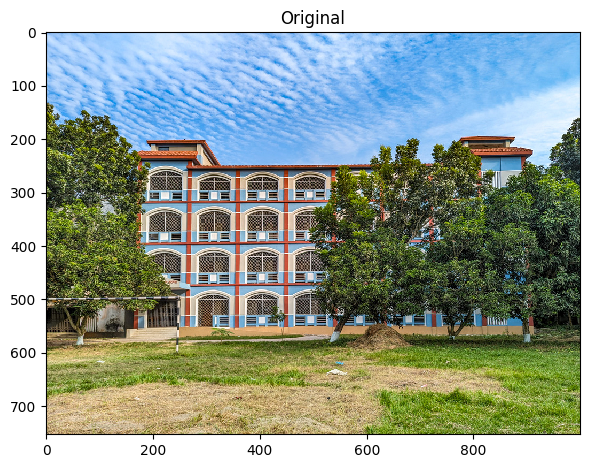

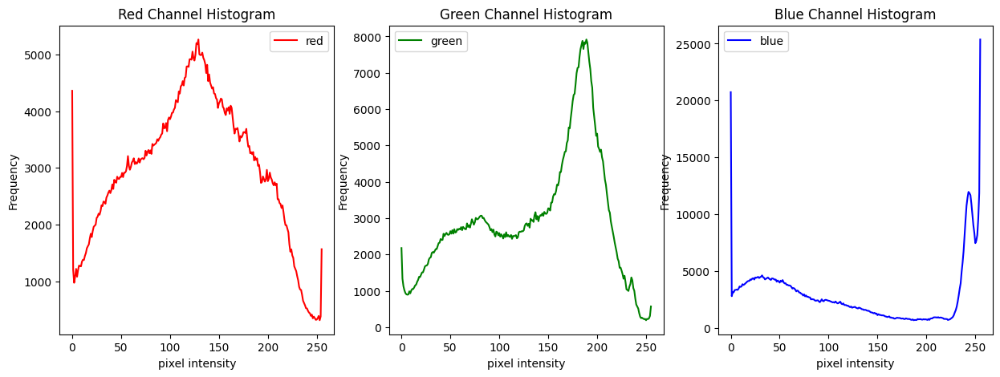

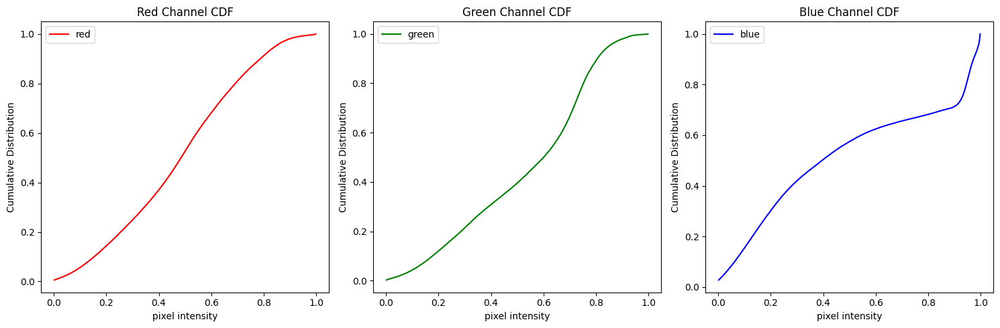

In [ ]:
# Plot the Image and its histogram + cdf of the original image I
# Note that it is a color image, so it will have three different histograms

### BEGIN SOLUTION
io.imshow(I)
plt.title('Original')
plt.show()

plt.figure(figsize=(15, 5))
for i, color in enumerate(['red', 'green', 'blue']):
    plt.subplot(1, 3, i + 1)
    hist, bin_edges = exposure.histogram(I[:, :, i], nbins=256)
    plt.plot(hist, color=color, label=color)
    plt.title(f'{color.capitalize()} Channel Histogram')
    plt.xlabel('pixel intensity')
    plt.ylabel('count')
    plt.legend()

plt.figure(figsize=(15, 5))
for i, color in enumerate(['red', 'green', 'blue']):
    cdf, bin_centers = exposure.cumulative_distribution(I[:, :, i], nbins=256)

    plt.subplot(1, 3, i + 1)
    plt.plot(bin_centers, cdf, color=color, label=color)
    plt.title(f'{color.capitalize()} Channel CDF')
    plt.xlabel('pixel intensity')
    plt.ylabel('Cumulative Distribution')
    plt.legend()

plt.tight_layout()
plt.show()
### END SOLUTION

In [ ]:
def plot_hist(I, nbins=256, normalize=False, plot_cdf=True):
    hist, bins_hist = exposure.histogram(I.ravel(), nbins=nbins, normalize=normalize)
    plt.plot(bins_hist, hist, 'k')
    plt.xlabel("pixel intensity")
    if normalize:
        plt.ylabel("probability")
    else:
        plt.ylabel("count")
    xmax = 1 if I.max() <= 1 else 255
    plt.xlim([0, xmax])

    if plot_cdf:
        cdf, bins_cdf = exposure.cumulative_distribution(I.ravel(), nbins=nbins)
        plt.twinx()
        plt.plot(bins_cdf, cdf, 'r', lw=3)
        plt.ylabel("percentage")

def plot_img_and_hist(I, nbins=256, normalize=False, plot_cdf=True, figsize=(12, 6)):
    fig, ax = plt.subplots(2, 1, figsize=figsize)
    plt.subplot(2, 1, 1)
    io.imshow(I)
    plt.axis("off")
    plt.title("image")

    plt.subplot(2, 1, 2)
    plot_hist(I, nbins=nbins, normalize=normalize, plot_cdf=plot_cdf)
    plt.title("histogram")

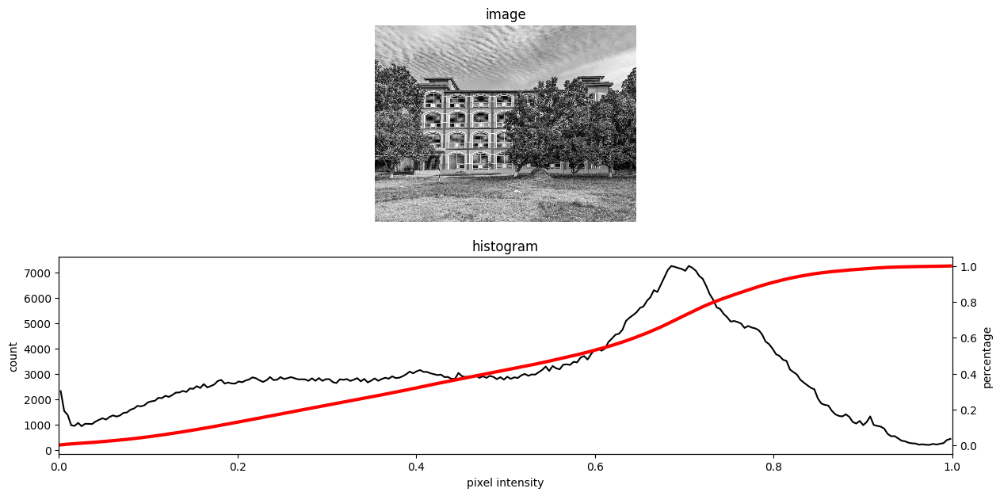

In [ ]:
# Plot the Image and its histogram + cdf of the grayscale image I_gray

### BEGIN SOLUTION
plt.rcParams['figure.figsize'] = (6, 6)
plot_img_and_hist(I_gray)
### END SOLUTION

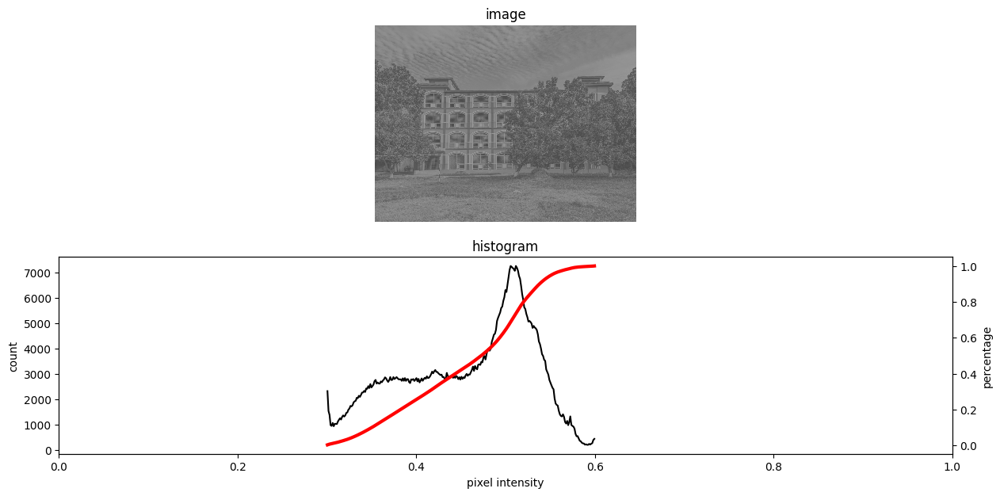

In [ ]:
# Plot the Image and its histogram + cdf of the degraded image I_degraded

### BEGIN SOLUTION
plt.rcParams['figure.figsize'] = (6, 6)
plot_img_and_hist(I_degraded)
### END SOLUTION

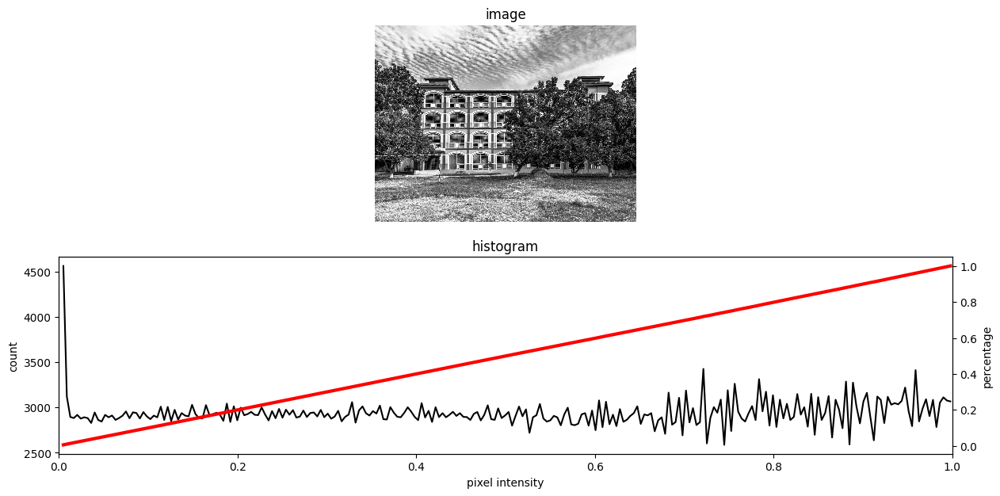

In [ ]:
# Equalize the histogram of the degraded image I_degraded
# Save the result in I_recon_gray, display the image along with its histogram

I_recon_gray = exposure.equalize_hist(I_degraded)

### BEGIN SOLUTION
plt.rcParams['figure.figsize'] = (6, 6)
plot_img_and_hist(I_recon_gray)
### END SOLUTION

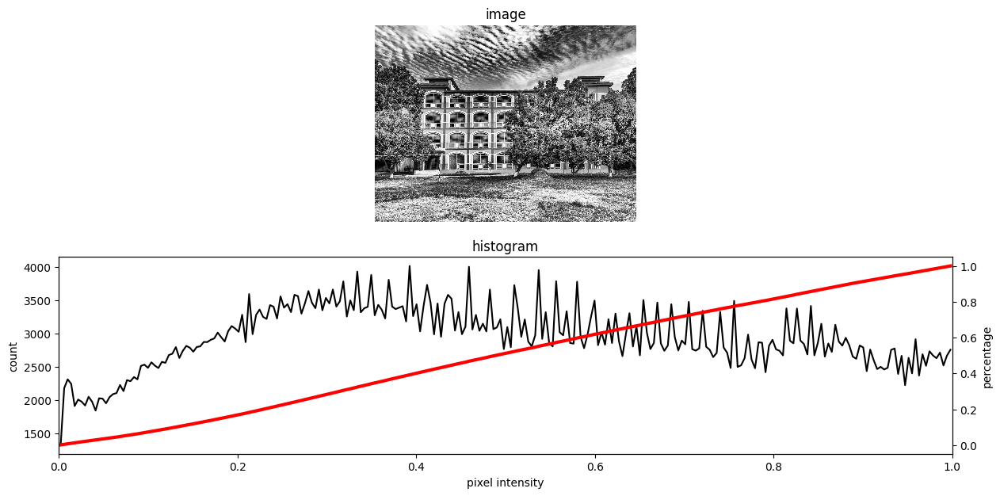

In [ ]:
# Equalize the histogram of the degraded image I_degraded using AHE
# Save the result in I_recon_gray_2, display the image along with its histogram

I_recon_gray_2 = exposure.equalize_adapthist(I_degraded, kernel_size=(256,256), clip_limit=0)
### BEGIN SOLUTION
plt.rcParams['figure.figsize'] = (6, 6)
plot_img_and_hist(I_recon_gray_2)

### END SOLUTION

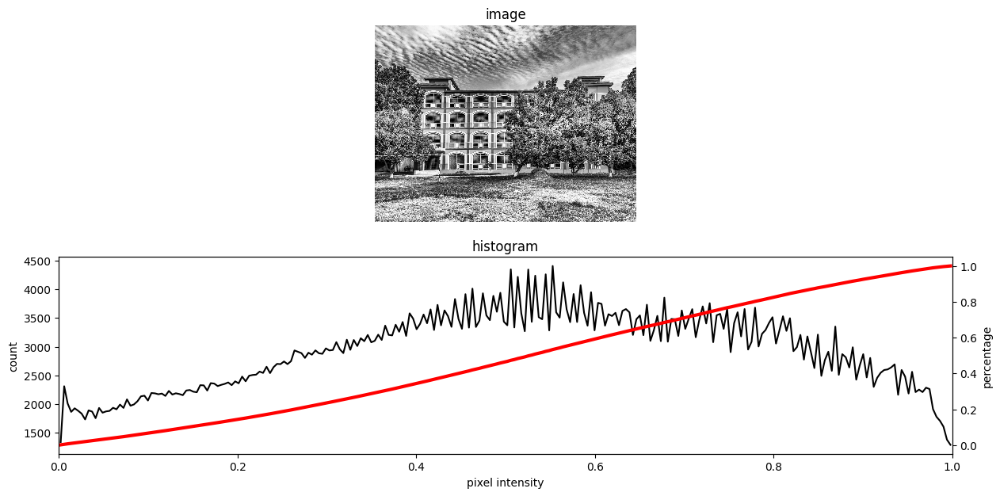

In [ ]:
# Equalize the histogram of the degraded image I_degraded using CLAHE
# Save the result in I_recon_gray_2, display the image along with its histogram

I_recon_gray_3 = exposure.equalize_adapthist(I_degraded, kernel_size=(256,256), clip_limit=0.01)
### BEGIN SOLUTION
plt.rcParams['figure.figsize'] = (6, 6)
plot_img_and_hist(I_recon_gray_3)

### END SOLUTION

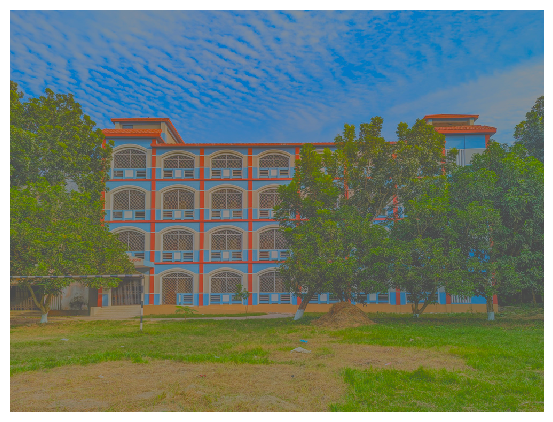

In [ ]:
# Artificially degrade the original **RGB image** by reducing it contrast
# You can do so by recaling the values of the L channel (in LAB color space)
# and concentrating them in a narrow range, say between 0.3 and 0.6.
# Save the image as I_rgb_degraded and display it
from skimage import color
I_rgb_degraded = color.rgb2lab(I)

### BEGIN SOLUTION
I_rgb_degraded[:, :, 0] = I_rgb_degraded[:, :, 0] / 100.0
I_rgb_degraded[:, :, 0] = exposure.rescale_intensity(I_rgb_degraded[:, :, 0], in_range=(0, 1), out_range=(0.3, 0.6))
I_rgb_degraded[:, :, 0] = I_rgb_degraded[:, :, 0] * 100.0
I_rgb_degraded = color.lab2rgb(I_rgb_degraded)

io.imshow(I_rgb_degraded)
plt.axis('off')
plt.show()
### END SOLUTION

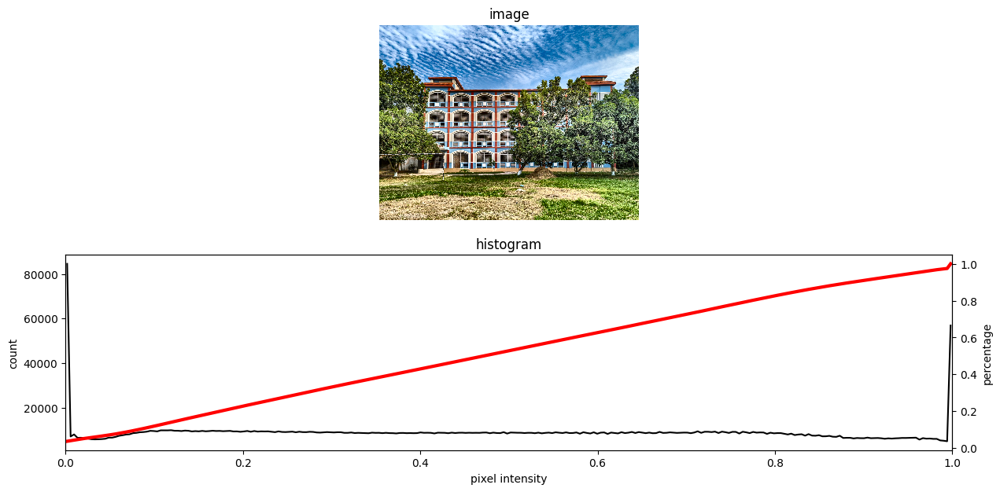

In [ ]:
# Equalize the histogram of the degraded color image I_rgb_degraded using CLAHE
# Save the result in I_recon_color, display the image along with its histogram
# HINT: You have to convert to LAB first
# See the lecture and lecture-4-demo-codes

I_recon_color = color.rgb2lab(I_rgb_degraded)

### BEGIN SOLUTION
I_recon_color[:, :, 0] = I_recon_color[:, :, 0] / 100.0
I_recon_color[:, :, 0] = exposure.equalize_adapthist(I_recon_color[:, :, 0], kernel_size=(256,256), clip_limit=0.01)
I_recon_color[:, :, 0] = I_recon_color[:, :, 0] * 100.0
I_recon_color = color.lab2rgb(I_recon_color)

plt.rcParams['figure.figsize'] = (6, 6)
plot_img_and_hist(I_recon_color)
### END SOLUTION

# Task 3 - Open Ended
 ## ***There are 3 images in the drive directory below. Look at the questions from the brackets [.]. Answer them in the provided text cell at the bottom.***

 ### link:  https://drive.google.com/drive/folders/1ft3XrO-MGxhxL2PfcLCFQjU0wvvlLAv4?usp=sharing

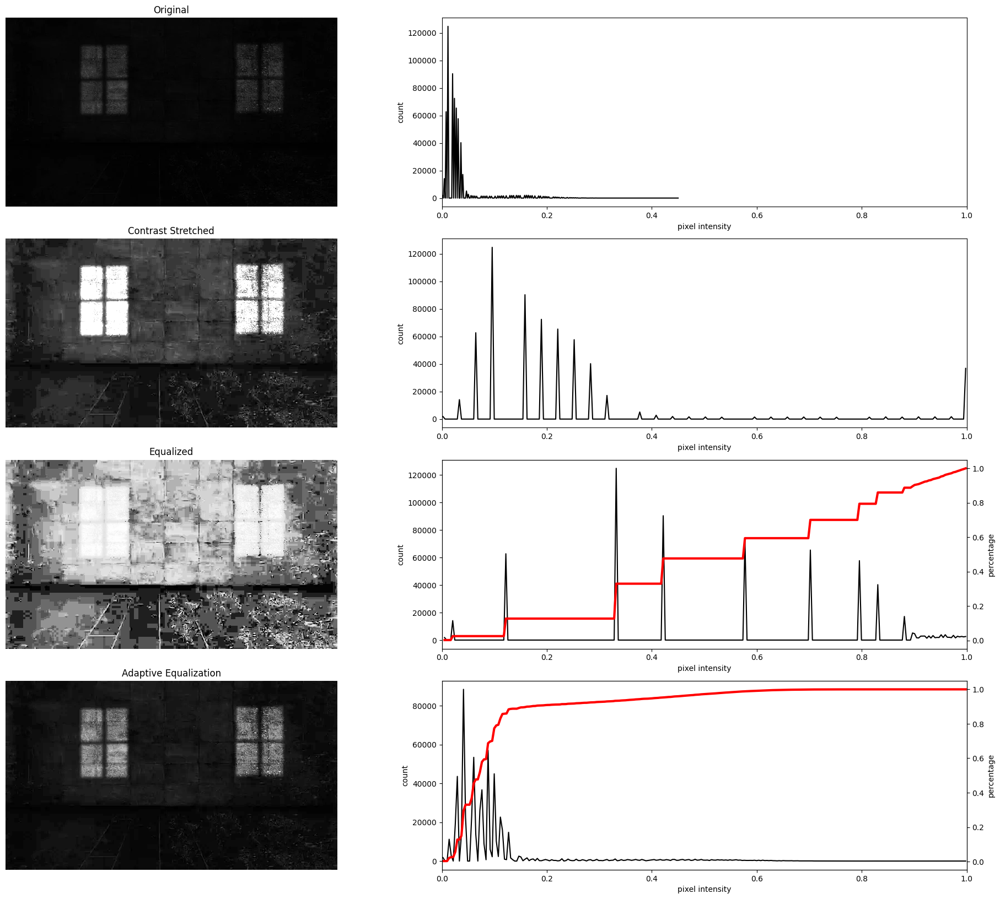

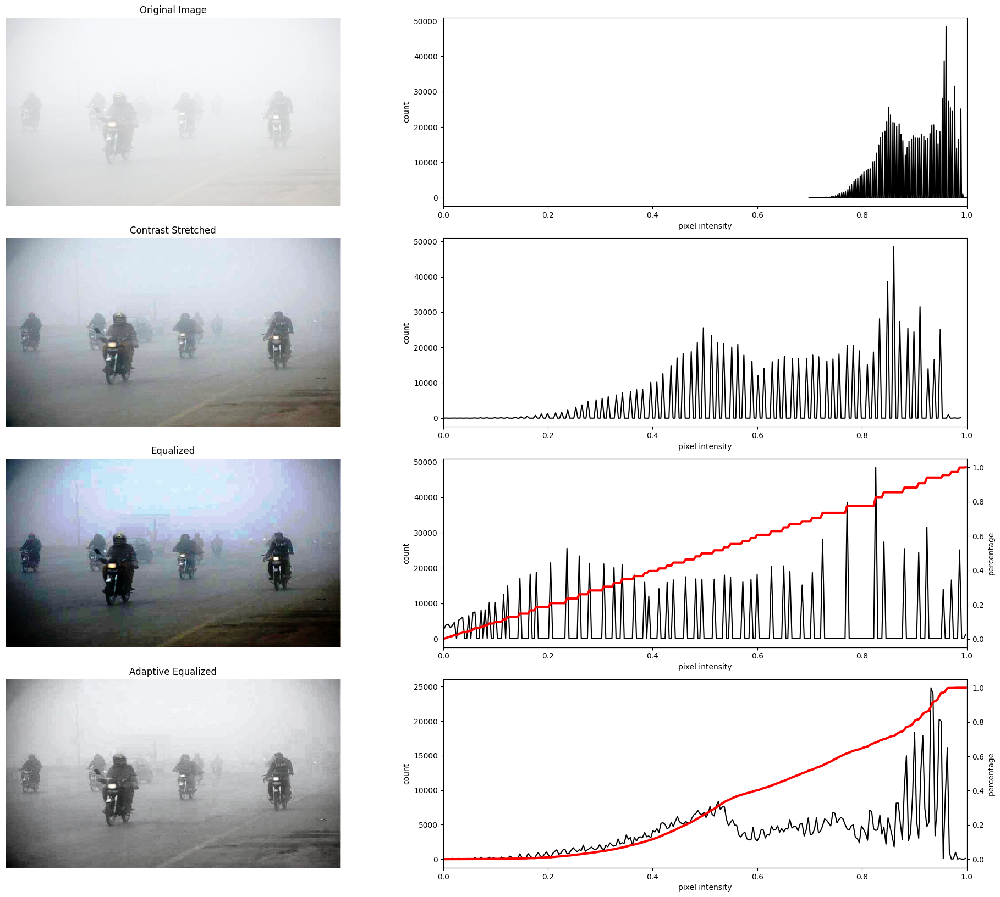

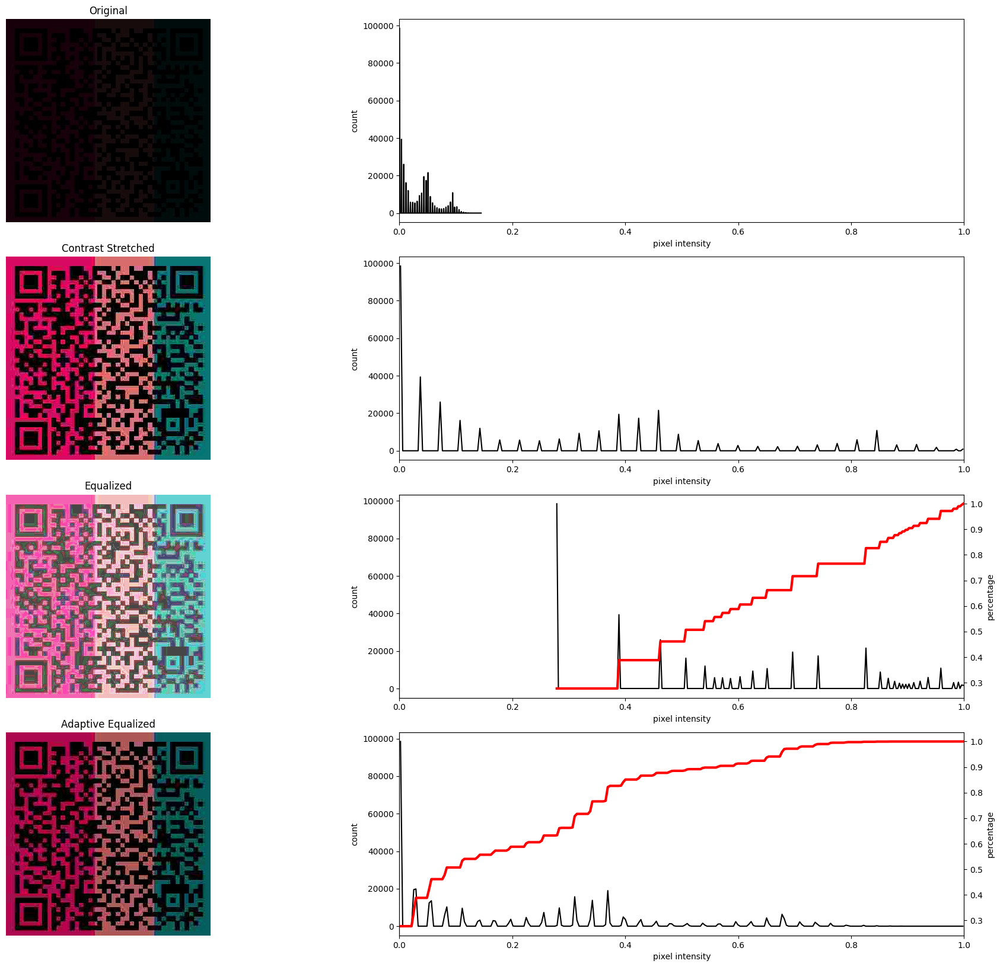

In [ ]:
# Dark_Room.jpg = very dark [The windows are on walls. How does the wall look like?]
# Foggy_Road.jpg = washed out/foggy [How many vehicles do you think there are?]
# Read_the_code.jpg = Dark RGB Barcode [What is hidden in the Barcode?
#                                       Make it scanable, scan it and say something about the hidden message.]

# Your task is to improve these images using
# contrast stretching, histogram equalization, AHE or CLAHE
# try different combination of parameter settings to see which produces the best result

### BEGIN SOLUTION


plt.figure(figsize=(20, 20))

plt.subplot(5, 2, 1)
I = io.imread("Dark_Room.jpg")
I = I/255.0
io.imshow(I)
plt.axis('off')
plt.title('Original')

plt.subplot(5, 2, 2)
plot_hist(I, nbins=256, normalize=False, plot_cdf=False)

plt.subplot(5, 2, 3)
I_contrast_stretched = np.clip(I * 8, 0, 1)
io.imshow(I_contrast_stretched)
plt.axis('off')
plt.title('Contrast Stretched')

plt.subplot(5, 2, 4)
plot_hist(I_contrast_stretched, nbins=256, normalize=False, plot_cdf=False)

plt.subplot(5, 2, 5)
I_equalized = exposure.equalize_hist(I)
io.imshow(I_equalized)
plt.axis('off')
plt.title('Equalized')

plt.subplot(5, 2, 6)
plot_hist(I_equalized, nbins=256, normalize=False, plot_cdf=True)

plt.subplot(5, 2, 7)
I_adapteq = exposure.equalize_adapthist(I, kernel_size=(256,256), clip_limit=0.01)
io.imshow(I_adapteq)
plt.axis('off')
plt.title('Adaptive Equalization')

plt.subplot(5, 2, 8)
plot_hist(I_adapteq, nbins=256, normalize=False, plot_cdf=True)

plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 20))

plt.subplot(5, 2, 1)
I = io.imread("Foggy_Road.jpg")
I = I/255.0
io.imshow(I)
plt.axis('off')
plt.title('Original Image')

plt.subplot(5, 2, 2)
plot_hist(I, nbins=256, normalize=False, plot_cdf=False)

plt.subplot(5, 2, 3)
I_contrast_stretched = np.clip((I-0.7)*3.3, 0, 1)
io.imshow(I_contrast_stretched)
plt.axis('off')
plt.title('Contrast Stretched')

plt.subplot(5, 2, 4)
plot_hist(I_contrast_stretched, nbins=256, normalize=False, plot_cdf=False)

plt.subplot(5, 2, 5)
I_equalized = exposure.equalize_hist(I)
io.imshow(I_equalized)
plt.axis('off')
plt.title('Equalized')

plt.subplot(5, 2, 6)
plot_hist(I_equalized, nbins=256, normalize=False, plot_cdf=True)

plt.subplot(5, 2, 7)
I_adapteq = exposure.equalize_adapthist(I, kernel_size=(256,256), clip_limit=0.01)
io.imshow(I_adapteq)
plt.axis('off')
plt.title('Adaptive Equalized')

plt.subplot(5, 2, 8)
plot_hist(I_adapteq, nbins=256, normalize=False, plot_cdf=True)

plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 20))

plt.subplot(5, 2, 1)
I = io.imread("Read_the_code.jpg")
I = I/255.0
plt.imshow(I)
plt.axis('off')
plt.title('Original')

plt.subplot(5, 2, 2)
plot_hist(I, nbins=256, normalize=False, plot_cdf=False)

plt.subplot(5, 2, 3)
I_contrast_stretched = np.clip(I*9, 0, 1)
io.imshow(I_contrast_stretched)
plt.axis('off')
plt.title('Contrast Stretched')

plt.subplot(5, 2, 4)
plot_hist(I_contrast_stretched, nbins=256, normalize=False, plot_cdf=False)

plt.subplot(5, 2, 5)
I_equalized = exposure.equalize_hist(I)
io.imshow(I_equalized)
plt.axis('off')
plt.title('Equalized')

plt.subplot(5, 2, 6)
plot_hist(I_equalized, nbins=256, normalize=False, plot_cdf=True)

plt.subplot(5, 2, 7)
I_adapteq = exposure.equalize_adapthist(I, kernel_size=(256,256), clip_limit=0.01)
io.imshow(I_adapteq)
plt.axis('off')
plt.title('Adaptive Equalized')

plt.subplot(5, 2, 8)
plot_hist(I_adapteq, nbins=256, normalize=False, plot_cdf=True)

plt.tight_layout()
plt.show()

### END SOLUTION

### Your answers:
1. For the first image, the best. quality we can get by contrast, stretching. We can see that the wall is made with tiles and rock.

2. For the second image, we can get the best result using the histogram equalization. We can see 9 vehicles on the road.

3. For the third image. we can get the best result using contrast stretching. It also makes the code scanable. After scanning the code, we get a link that I am showing below.

https://docs.google.com/document/d/1Y3Z_DvDcCJG9a0C4N4CMfX4KM5wGP-cxBekb8WT2cfg/edit#heading=h.o4v8uit6s38p.